#  <img align="left" style="width: 100px;" src="escudo.jpg">

# Proyecto Final <br>
### Jesus Anibal Osorio Castaño 
#### CC. 15451068

# 1. Diseño de Filtros con Respuesta infinita al Impulso (IIR)

## 1.1 Procedimiento

In [1]:
import numpy as np
from scipy.io.wavfile import read
from IPython.display import Audio
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.signal as sp

# Filtros de Butterworth

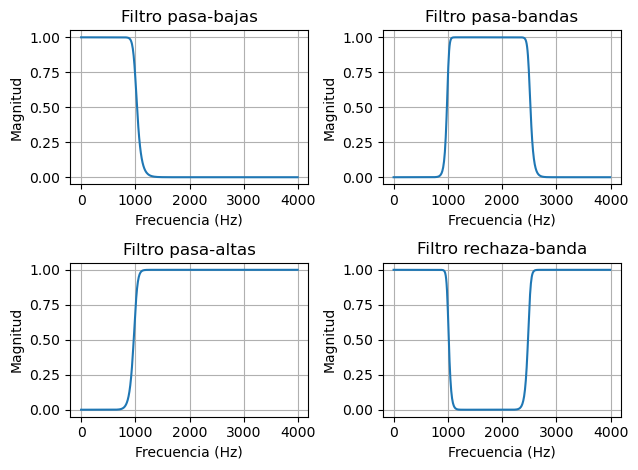

In [44]:
# Especificaciones del filtro
order = 16  # Orden del filtro
cutoff_freq = 1000  # Frecuencia de corte en Hz
cutoff_freq2 = 2500  # Frecuencia de corte en Hz
sampling_freq = 8000  # Frecuencia de muestreo en Hz
fs = sampling_freq

# Diseño del filtro Butterworth

#filtro pasa-bajas
b, a = sp.butter(order, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)


#filtro pasa-altas
b, a = sp.butter(order, cutoff_freq/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)


#filtro pasa-bandas
b, a = sp.butter(order, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a);


#filtro rechaza-bandas
b, a = sp.butter(order, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)] , btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a);


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot((w1*fs)/(2*np.pi),np.abs(h1))
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot((w2*fs)/(2*np.pi),np.abs(h2))
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot((w3*fs)/(2*np.pi),np.abs(h3))
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot((w4*fs)/(2*np.pi),np.abs(h4))
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

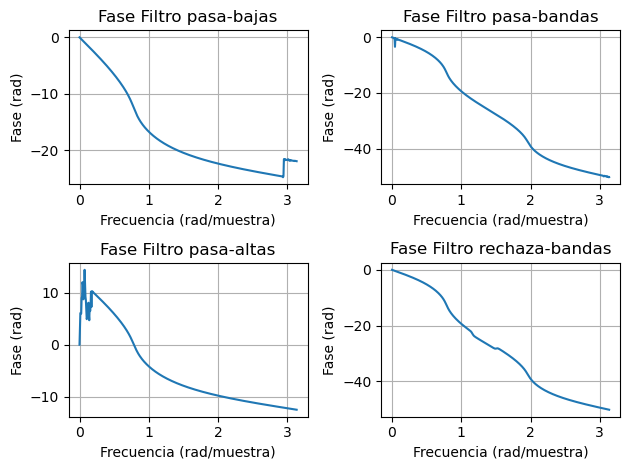

In [45]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

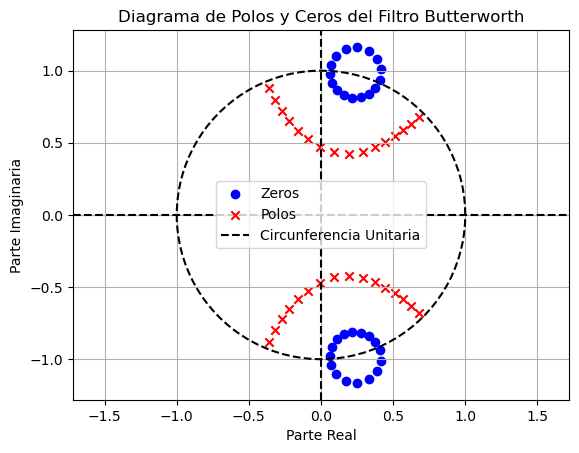

In [46]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Butterworth')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()


##### El filtro Butterworth tiene una respuesta en frecuencia lo más plana posible en la banda de paso y en la banda no pasante, una caída gradual en la banda de rechazo. al imponer que la respuesta en magnitud del filtro sea máximamente plana en la banda pasante y en la banda no pasante. 
##### Presentan una respuesta en frecuencia monótona decreciente y una caída suave en frecuencias bajas.
##### Cabe destacar que mientras más alto sea el orden del filtro, más pronunciada será la pendiente, por lo tanto, el desempeño del filtro se asemejará más al comportamiento de un filtro ideal.
##### El orden del filtro determina la cantidad de polos en el sistema y afecta la forma y la eficiencia del filtro. A medida que aumenta el orden del filtro, se logra una mayor atenuación en la banda de rechazo, pero también se introduce una mayor distorsión en la fase.

#### 

# Filtros de Tchebyshev

### Filtros de Tchebyshev Tipo I

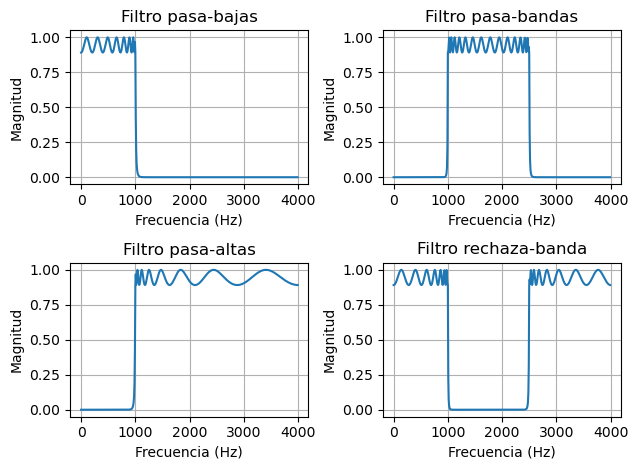

In [5]:
# Especificaciones del filtro
order = 16  # Orden del filtro
ripple = 1  # Rizado en decibeles
cutoff_freq = 1000  # Frecuencia de corte en Hz
cutoff_freq2 = 2500  # Frecuencia de corte en Hz
sampling_freq = 8000  # Frecuencia de muestreo en Hz
fs = sampling_freq

# Diseño del filtro Tchebyshev tipo I

#filtro pasa-bajas
b, a = sp.cheby1(order, ripple, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)

#filtro pasa-bandas
b, a = sp.cheby1(order, ripple, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a)

#filtro pasa-altas
b, a = sp.cheby1(order, ripple, cutoff_freq/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)

#filtro rechaza-bandas
b, a = sp.cheby1(order, ripple, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a)


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot((w1*fs)/(2*np.pi),np.abs(h1))
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot((w2*fs)/(2*np.pi),np.abs(h2))
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot((w3*fs)/(2*np.pi),np.abs(h3))
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot((w4*fs)/(2*np.pi),np.abs(h4))
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

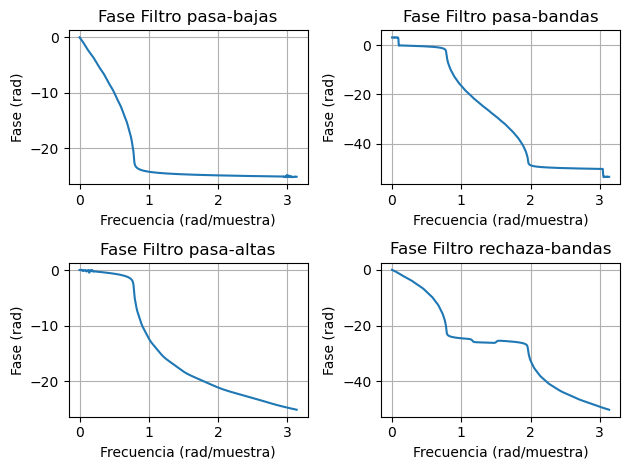

In [6]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

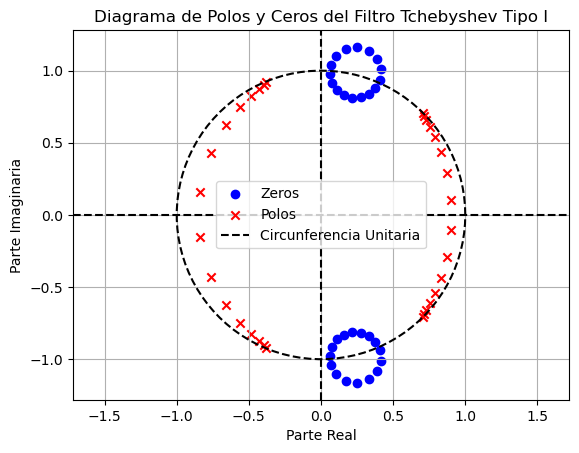

In [7]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Tchebyshev Tipo I')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

##### Se obtiene una pendiente más pronunciada que un Butterworth en la región de transición, sin embargo, su respuesta en la banda pasante no es plana, sino que se presentarán rizados.

##### Tiene una respuesta en frecuencia que presenta una mayor cantidad de rizado en la banda de paso pero una caída más rápida en la banda de rechazo. Esto significa que el filtro permite el paso de frecuencias en la banda de paso con una atenuación mínima, pero presenta oscilaciones o rizado en la respuesta en frecuencia. El grado de rizado se controla mediante el parámetro de rizado, que determina la cantidad de rizado permitido en la banda de paso.

##### Presentan rizado constante en la banda pasante.
##### Presentan una caída monotónica en la banda no pasante.

##### El número de rizados se obtiene a partir de: 
##### 𝑁 𝑑𝑒 𝑟𝑖𝑧𝑎𝑑𝑜𝑠 = 𝑛/ 2
##### Donde n es el número de rizados. 

##### Mientras más alto sea el orden del filtro, más pronunciada será la pendiente, pero a su vez habrán más rizados en la banda pasante.
##### La transición a partir de la frecuencia es muy abrupta, pero en la banda de paso tenemos un rizado. Su utilización se restringirá a aquellas aplicaciones en el que el contenido de frecuencias es más importante que la magnitud.

### Filtros de Tchebyshev Tipo II

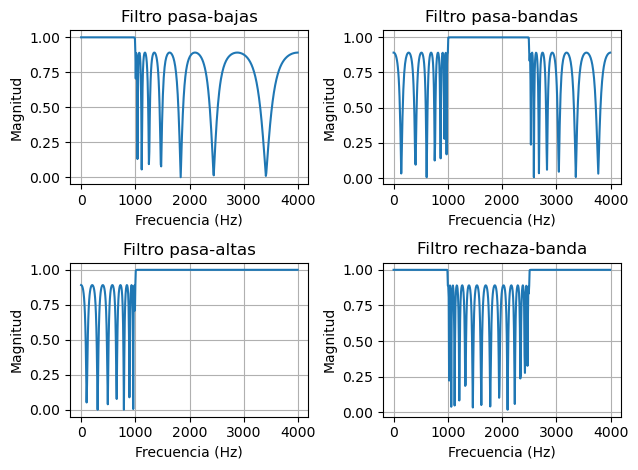

In [8]:
# Especificaciones del filtro
order = 16  # Orden del filtro
ripple = 1  # Rizado en decibeles
cutoff_freq = 1000  # Frecuencia de corte en Hz
cutoff_freq2 = 2500  # Frecuencia de corte en Hz
sampling_freq = 8000  # Frecuencia de muestreo en Hz
fs = sampling_freq

# Diseño del filtro Tchebyshev tipo II

#filtro pasa-bajas
b, a = sp.cheby2(order, ripple, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)

#filtro pasa-bandas
b, a = sp.cheby2(order, ripple, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a)

#filtro pasa-altas
b, a = sp.cheby2(order, ripple, cutoff_freq/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)

#filtro rechaza-bandas
b, a = sp.cheby2(order, ripple, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a)


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot((w1*fs)/(2*np.pi),np.abs(h1))
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot((w2*fs)/(2*np.pi),np.abs(h2))
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot((w3*fs)/(2*np.pi),np.abs(h3))
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot((w4*fs)/(2*np.pi),np.abs(h4))
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

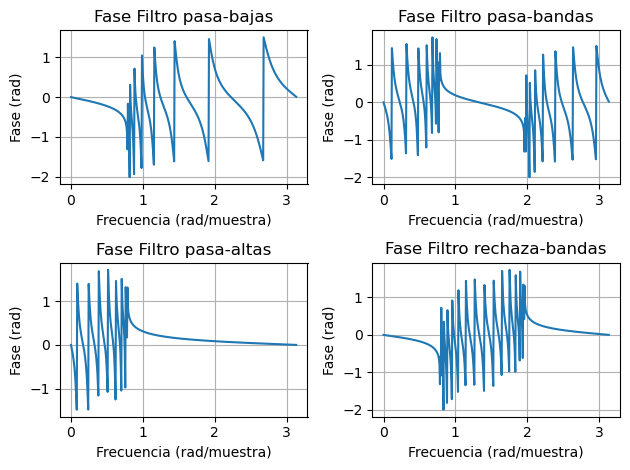

In [9]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

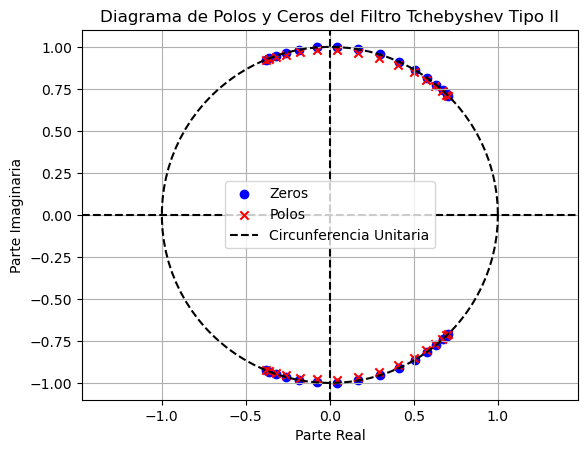

In [10]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Tchebyshev Tipo II')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

##### Tiene una respuesta en frecuencia que presenta una atenuación constante en la banda de paso y una mayor cantidad de rizado en la banda de rechazo. Este tipo de filtro se utiliza cuando se desea atenuar selectivamente una banda de frecuencia específica mientras se permite el paso de otras frecuencias.

##### Presentan rizado constante en la banda no pasante
##### Presentan una caída monotónica en la banda pasante. 

##### Los filtros Chebyshev tipo I y tipo II ofrecen mayor selectividad en la respuesta en frecuencia en comparación con los filtros Butterworth, a costa de introducir rizado en la banda de paso o en la banda de rechazo, respectivamente. La elección entre ambos tipos de filtro depende de las necesidades específicas de la aplicación y los requisitos de atenuación y rizado en la respuesta en frecuencia.


# Filtros Elípticos

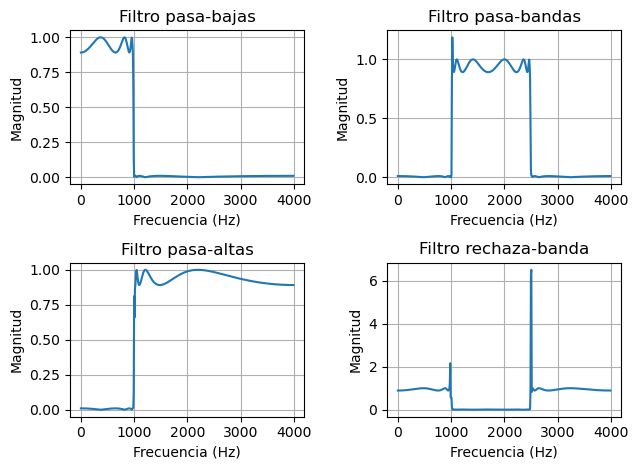

In [11]:
# Especificaciones del filtro
order = 16  # Orden del filtro
ripple_pass = 1  # Rizado en la banda de paso en decibeles
ripple_stop = 40  # Atenuación en la banda de paro en decibeles
cutoff_freq = 1000  # Frecuencia de corte en Hz
cutoff_freq2 = 2500  # Frecuencia de corte en Hz
sampling_freq = 8000  # Frecuencia de muestreo en Hz
fs = sampling_freq


# Diseño del filtro Elíptico

#filtro pasa-bajas
b, a = sp.ellip(order, ripple_pass, ripple_stop, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)


#filtro pasa-altas
b, a = sp.ellip(order, ripple_pass, ripple_stop, cutoff_freq/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)


#filtro pasa-bandas
b, a = sp.ellip(order, ripple_pass, ripple_stop, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a);


#filtro rechaza-bandas
b, a = sp.ellip(order, ripple_pass, ripple_stop, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a);


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot((w1*fs)/(2*np.pi),np.abs(h1))
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot((w2*fs)/(2*np.pi),np.abs(h2))
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot((w3*fs)/(2*np.pi),np.abs(h3))
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot((w4*fs)/(2*np.pi),np.abs(h4))
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

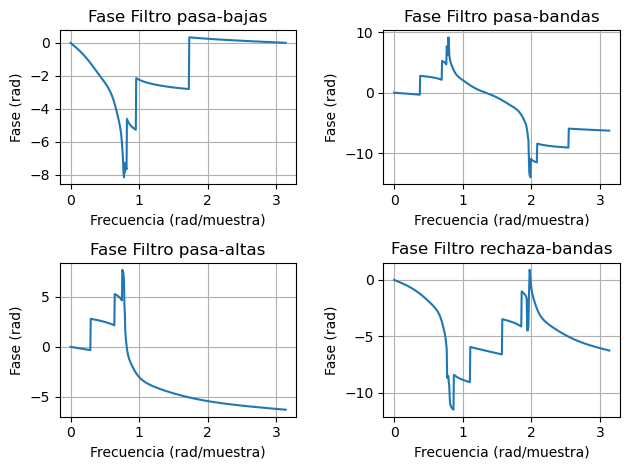

In [12]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

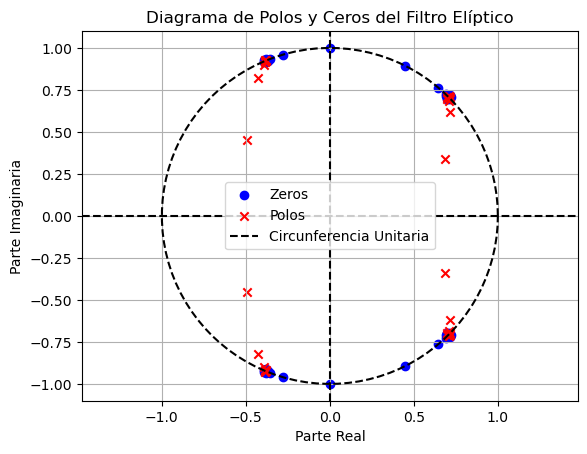

In [13]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Elíptico')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

##### Estos filtros son los que presentan fase menos lineal.

##### Los filtros elípticos logran una atenuación mínima en la banda de paso y una atenuación máxima en la banda de rechazo. 
##### Proporcionan una respuesta una atenuación muy pronunciada en la banda de rechazo.

##### El orden del filtro está relacionado con la cantidad de polos y ceros requeridos para lograr la respuesta en frecuencia deseada.

##### Estos filtros son ideales cuando se requiere una alta selectividad.

# Filtros de Bessel

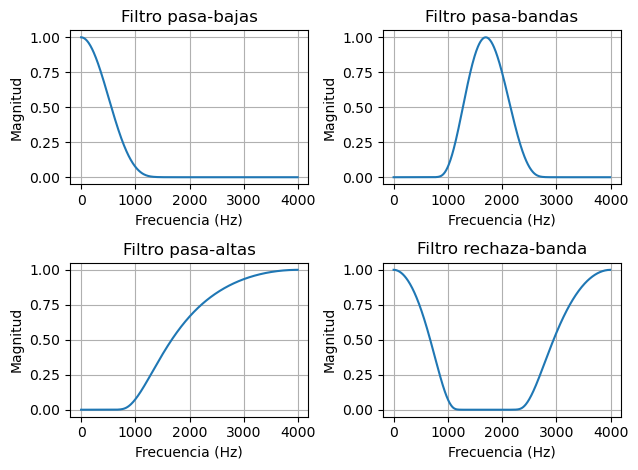

In [14]:
# Especificaciones del filtro
order = 16  # Orden del filtro
cutoff_freq = 1000  # Frecuencia de corte en Hz
cutoff_freq2 = 2500  # Frecuencia de corte en Hz
sampling_freq = 8000  # Frecuencia de muestreo en Hz
fs = sampling_freq

# Diseño del filtro Bessel


#filtro pasa-bajas
b, a = sp.bessel(order, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)


#filtro pasa-altas
b, a = sp.bessel(order, cutoff_freq/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)


#filtro pasa-bandas
b, a = sp.bessel(order, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a);


#filtro rechaza-bandas
b, a = sp.bessel(order, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a);


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot((w1*fs)/(2*np.pi),np.abs(h1))
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot((w2*fs)/(2*np.pi),np.abs(h2))
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot((w3*fs)/(2*np.pi),np.abs(h3))
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot((w4*fs)/(2*np.pi),np.abs(h4))
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

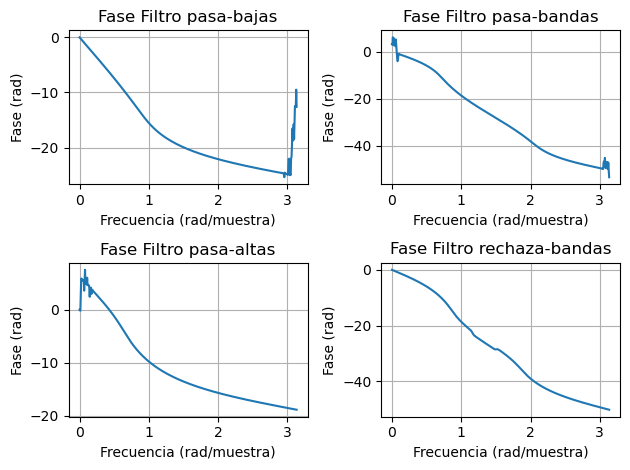

In [15]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

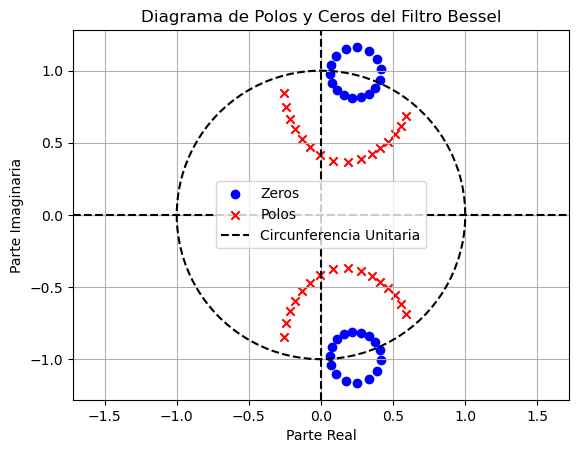

In [16]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Bessel')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

##### Estos filtros presentan fase lineal en la banda pasante, es decir, no distorsionan la señal, a costa de aumentar la zona de transición.

##### Su respuesta de fase lineal, significa que todas las componentes de frecuencia de la señal de entrada se retrasan en la misma cantidad de tiempo.

##### Los filtros Bessel proporcionan una respuesta en frecuencia con una fase lineal y una respuesta de amplitud casi plana en la banda de paso. Estos filtros son ideales cuando se necesita preservar la forma de onda y la fase de la señal de entrada.


# 2. Filtrado de música con los diferentes filtros

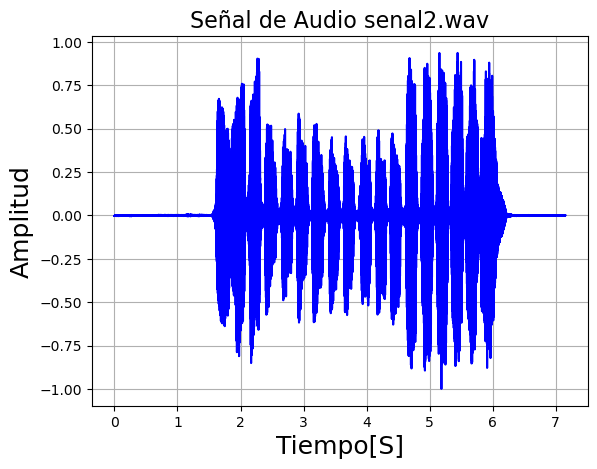

Duracion = 7.151768707482993 , Frecuencia de Muestreo = 44100 Muestras/Seg


In [17]:
file_audio=('mezcla.wav')
fs, x=read(file_audio)


x=x/float(max(abs(x)))
t=np.arange(0,float(len(x))/fs, 1.0/fs)

plt.plot(t,x, color='blue')
plt.title('Señal de Audio senal2.wav',size=16)
plt.xlabel('Tiempo[S]',fontsize=18)
plt.ylabel('Amplitud',fontsize=18)
plt.grid()
plt.show()

print(f'Duracion = {x.shape[0]/fs} , Frecuencia de Muestreo = {fs} Muestras/Seg')


Audio(x,rate=fs)

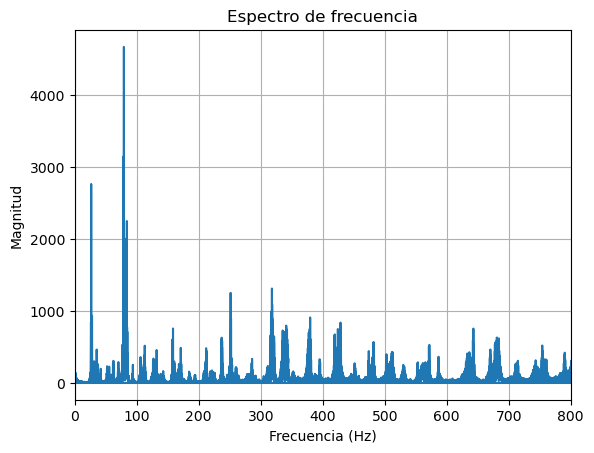

In [18]:
import scipy.fft as fft

# Aplicar la Transformada de Fourier a la señal
spectrum = fft.fft(x)
# Obtener los valores absolutos del espectro
spectrum_abs = np.abs(spectrum)
# Calcular las frecuencias correspondientes
freq = np.fft.fftfreq(len(x), 1 / sampling_freq)

# Graficar la magnitud en función de la frecuencia
plt.plot(freq, spectrum_abs)
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.title('Espectro de frecuencia')
plt.xlim(0, 800)
plt.grid(True)
plt.show()

## 2.1 Filtros de Butterworth

In [19]:
# Diseño del filtro Butterworth
order = 4  # Orden del filtro
cutoff_freq = 262  # Frecuencia de corte en Hz
cutoff_freq2 = 526  # Frecuencia de corte en Hz
sampling_freq = fs  # Frecuencia de muestreo en Hz

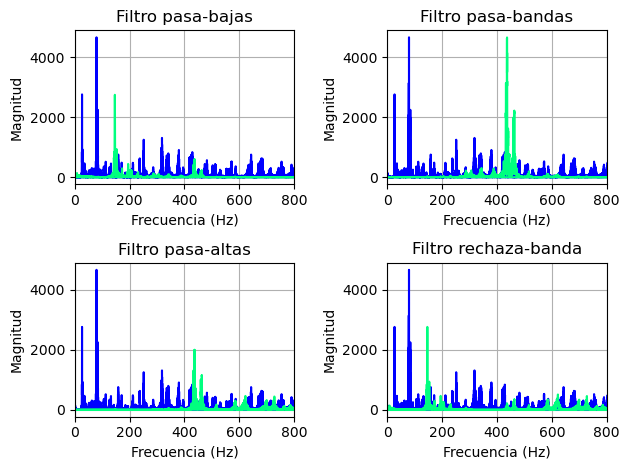

In [20]:
import scipy.fft as fft
# Diseño del filtro Butterworth

#filtro pasa-bajas
b, a = sp.butter(order, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y1 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum1 = fft.fft(y1)
# Obtener los valores absolutos del espectro
spectrum_abs1 = np.abs(spectrum1)
# Calcular las frecuencias correspondientes
freq1 = np.fft.fftfreq(len(y1), 1 / sampling_freq)


#filtro pasa-altas
b, a = sp.butter(order, cutoff_freq2/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y2 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum2 = fft.fft(y2)
# Obtener los valores absolutos del espectro
spectrum_abs2 = np.abs(spectrum2)
# Calcular las frecuencias correspondientes
freq2 = np.fft.fftfreq(len(y2), 1 / sampling_freq)

#filtro pasa-bandas
b, a = sp.butter(order, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a);
# Filtro aplicado a la señal de audio
y3 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum3 = fft.fft(y3)
# Obtener los valores absolutos del espectro
spectrum_abs3 = np.abs(spectrum3)
# Calcular las frecuencias correspondientes
freq3 = np.fft.fftfreq(len(y3), 1 / sampling_freq)


#filtro rechaza-bandas
b, a = sp.butter(order, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)] , btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a);
# Filtro aplicado a la señal de audio
y4 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum4 = fft.fft(y4)
# Obtener los valores absolutos del espectro
spectrum_abs4 = np.abs(spectrum4)
# Calcular las frecuencias correspondientes
freq4 = np.fft.fftfreq(len(y4), 1 / sampling_freq)


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(freq,spectrum_abs, color='blue')
axs[0, 0].plot(freq1, spectrum_abs1, color='springgreen')
axs[0, 0].set_xlim(0, 800)
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot(freq,spectrum_abs, color='blue')
axs[1, 0].plot(freq2, spectrum_abs2, color='springgreen')
axs[1, 0].set_xlim(0, 800)
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(freq,spectrum_abs, color='blue')
axs[0, 1].plot(freq3, spectrum_abs3, color='springgreen')
axs[0, 1].set_xlim(0, 800)
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot(freq,spectrum_abs, color='blue')
axs[1, 1].plot(freq4, spectrum_abs4, color='springgreen')
axs[1, 1].set_xlim(0, 800)
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

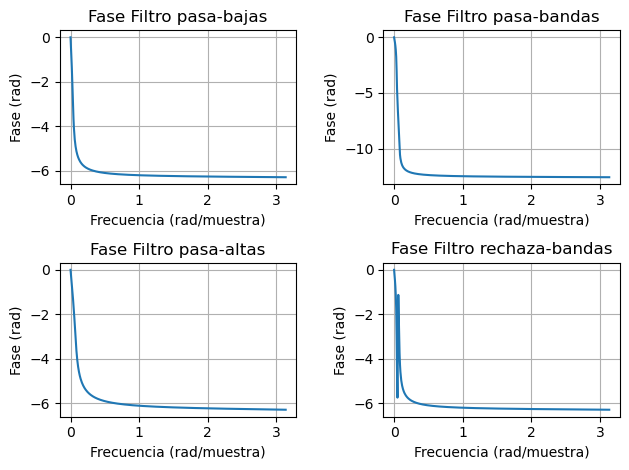

In [21]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

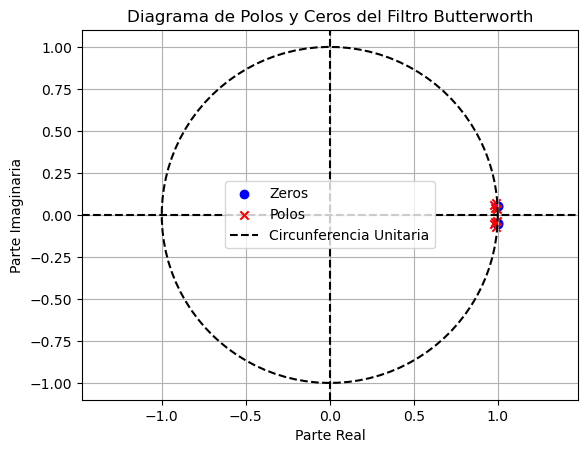

In [22]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Butterworth')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

In [23]:
from IPython.display import display

print('Pasa-bajas')
display(Audio(y1, rate=fs))

print('Pasa-altas')
display(Audio(y2, rate=fs))

print('Pasa-bandas')
display(Audio(y3, rate=fs))

print('Rechaza-bandas')
display(Audio(y4, rate=fs))

Pasa-bajas


Pasa-altas


Pasa-bandas


Rechaza-bandas


##### Podemos escuchar una buena respuesta del filtro pasa-bajas.
##### El pasa-altas no es bien eficiente pues se logran escuchar frecuencias de la banda de transición, incluso parte de la banda eliminada.
##### El pasa-bandas tiene buena respuesta  aunque se escuchan frecuencias de las bandas de transición.
##### El rechaza-bandas podemos escuchar una buena respuesta del filtro.

## 2.3 Filtros de Tchebyshev Tipo I

In [24]:
# Especificaciones del filtro
order = 4  # Orden del filtro
cutoff_freq = 262  # Frecuencia de corte en Hz
cutoff_freq2 = 526  # Frecuencia de corte en Hz
sampling_freq = fs  # Frecuencia de muestreo en Hz
ripple = 1  # Rizado en decibeles

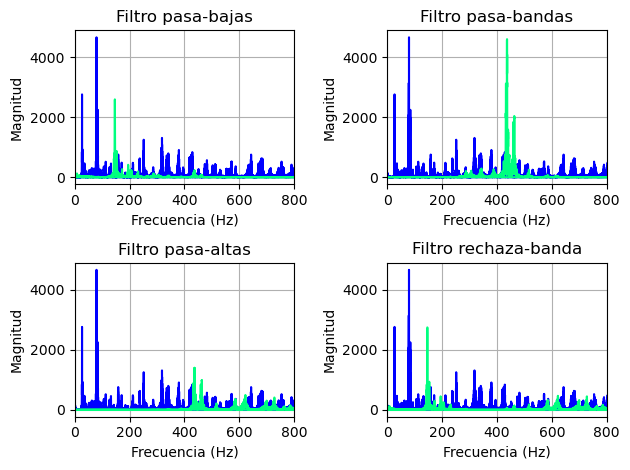

In [25]:
# Diseño del filtro Tchebyshev tipo I

#filtro pasa-bajas
b, a = sp.cheby1(order, ripple, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y1 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum1 = fft.fft(y1)
# Obtener los valores absolutos del espectro
spectrum_abs1 = np.abs(spectrum1)
# Calcular las frecuencias correspondientes
freq1 = np.fft.fftfreq(len(y1), 1 / sampling_freq)

#filtro pasa-bandas
b, a = sp.cheby1(order, ripple, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y3 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum3 = fft.fft(y3)
# Obtener los valores absolutos del espectro
spectrum_abs3 = np.abs(spectrum3)
# Calcular las frecuencias correspondientes
freq3 = np.fft.fftfreq(len(y3), 1 / sampling_freq)

#filtro pasa-altas
b, a = sp.cheby1(order, ripple, cutoff_freq2/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y2 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum2 = fft.fft(y2)
# Obtener los valores absolutos del espectro
spectrum_abs2 = np.abs(spectrum2)
# Calcular las frecuencias correspondientes
freq2 = np.fft.fftfreq(len(y2), 1 / sampling_freq)

#filtro rechaza-bandas
b, a = sp.cheby1(order, ripple, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y4 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum4 = fft.fft(y4)
# Obtener los valores absolutos del espectro
spectrum_abs4 = np.abs(spectrum4)
# Calcular las frecuencias correspondientes
freq4 = np.fft.fftfreq(len(y4), 1 / sampling_freq)


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(freq,spectrum_abs, color='blue')
axs[0, 0].plot(freq1, spectrum_abs1, color='springgreen')
axs[0, 0].set_xlim(0, 800)
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot(freq,spectrum_abs, color='blue')
axs[1, 0].plot(freq2, spectrum_abs2, color='springgreen')
axs[1, 0].set_xlim(0, 800)
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(freq,spectrum_abs, color='blue')
axs[0, 1].plot(freq3, spectrum_abs3, color='springgreen')
axs[0, 1].set_xlim(0, 800)
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot(freq,spectrum_abs, color='blue')
axs[1, 1].plot(freq4, spectrum_abs4, color='springgreen')
axs[1, 1].set_xlim(0, 800)
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

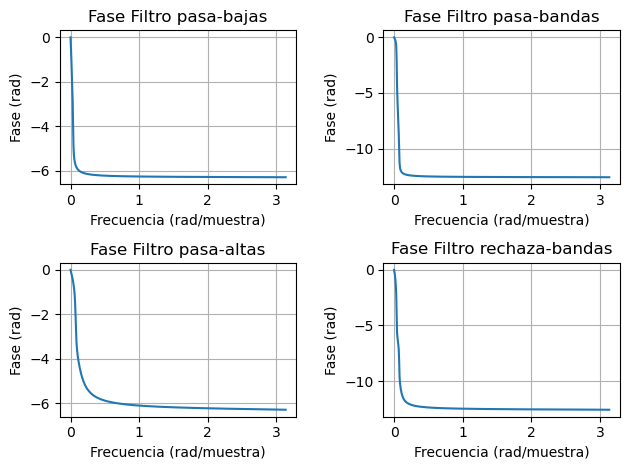

In [26]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

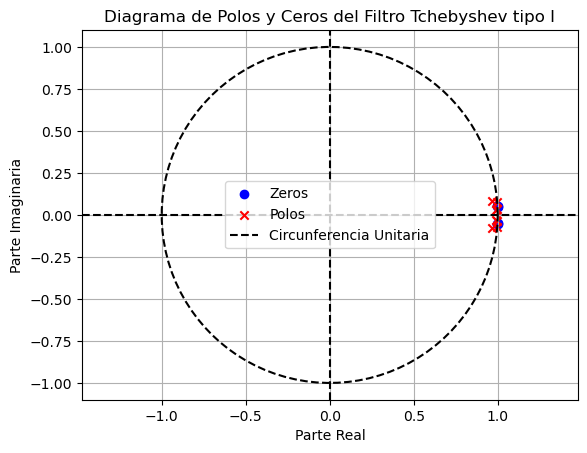

In [27]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Tchebyshev tipo I')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

In [28]:
print('Pasa-bajas')
display(Audio(y1, rate=fs))

print('Pasa-altas')
display(Audio(y2, rate=fs))

print('Pasa-bandas')
display(Audio(y3, rate=fs))

print('Rechaza-bandas')
display(Audio(y4, rate=fs))

Pasa-bajas


Pasa-altas


Pasa-bandas


Rechaza-bandas


##### Podemos escuchar una buena respuesta del filtro pasa-bajas.
##### El pasa-altas no es bien eficiente pues se logran escuchar frecuencias de la banda eliminada.
##### El pasa-bandas tiene buena respuesta.
##### El rechaza-bandas no tiene una buan respuesta pues se escuchan frecuencias de la banda eliminada.

## 2.3 Filtros de Tchebyshev Tipo II

In [29]:
# Especificaciones del filtro
order = 4  # Orden del filtro
cutoff_freq = 262  # Frecuencia de corte en Hz
cutoff_freq2 = 526  # Frecuencia de corte en Hz
sampling_freq = fs  # Frecuencia de muestreo en Hz
ripple = 1  # Rizado en decibeles

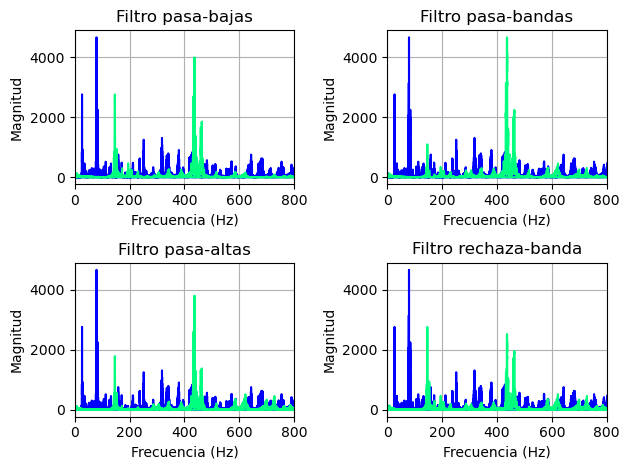

In [30]:
# Diseño del filtro Tchebyshev tipo II

#filtro pasa-bajas
b, a = sp.cheby2(order, ripple, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y1 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum1 = fft.fft(y1)
# Obtener los valores absolutos del espectro
spectrum_abs1 = np.abs(spectrum1)
# Calcular las frecuencias correspondientes
freq1 = np.fft.fftfreq(len(y1), 1 / sampling_freq)


#filtro pasa-bandas
b, a = sp.cheby2(order, ripple, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y3 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum3 = fft.fft(y3)
# Obtener los valores absolutos del espectro
spectrum_abs3 = np.abs(spectrum3)
# Calcular las frecuencias correspondientes
freq3 = np.fft.fftfreq(len(y3), 1 / sampling_freq)


#filtro pasa-altas
b, a = sp.cheby2(order, ripple, cutoff_freq2/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y2 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum2 = fft.fft(y2)
# Obtener los valores absolutos del espectro
spectrum_abs2 = np.abs(spectrum2)
# Calcular las frecuencias correspondientes
freq2 = np.fft.fftfreq(len(y2), 1 / sampling_freq)


#filtro rechaza-bandas
b, a = sp.cheby2(order, ripple, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y4 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum4 = fft.fft(y4)
# Obtener los valores absolutos del espectro
spectrum_abs4 = np.abs(spectrum4)
# Calcular las frecuencias correspondientes
freq4 = np.fft.fftfreq(len(y4), 1 / sampling_freq)


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(freq,spectrum_abs, color='blue')
axs[0, 0].plot(freq1, spectrum_abs1, color='springgreen')
axs[0, 0].set_xlim(0, 800)
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot(freq,spectrum_abs, color='blue')
axs[1, 0].plot(freq2, spectrum_abs2, color='springgreen')
axs[1, 0].set_xlim(0, 800)
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(freq,spectrum_abs, color='blue')
axs[0, 1].plot(freq3, spectrum_abs3, color='springgreen')
axs[0, 1].set_xlim(0, 800)
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot(freq,spectrum_abs, color='blue')
axs[1, 1].plot(freq4, spectrum_abs4, color='springgreen')
axs[1, 1].set_xlim(0, 800)
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

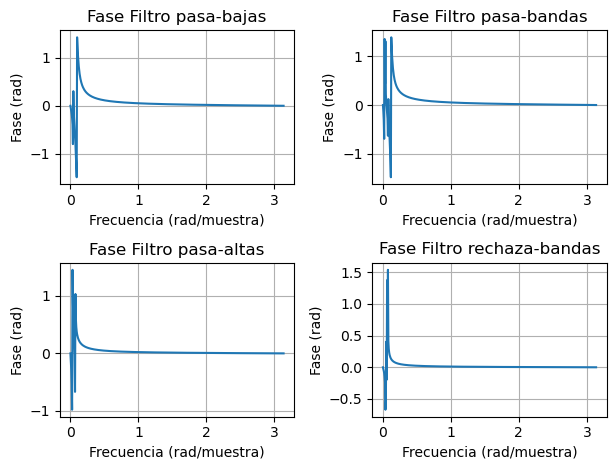

In [31]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

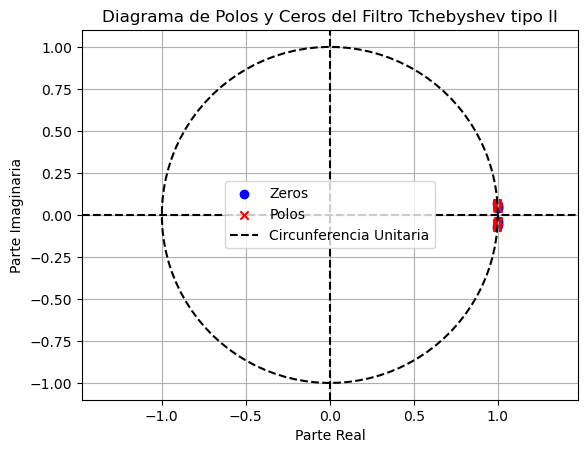

In [32]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Tchebyshev tipo II')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

In [33]:
print('Pasa-bajas')
display(Audio(y1, rate=fs))

print('Pasa-altas')
display(Audio(y2, rate=fs))

print('Pasa-bandas')
display(Audio(y3, rate=fs))

print('Rechaza-bandas')
display(Audio(y4, rate=fs))

Pasa-bajas


Pasa-altas


Pasa-bandas


Rechaza-bandas


##### E pasa-bajas no tiene una buena respuesta podemos escuchar frecuencias de la banda eliminada.
##### El pasa-altas no tiene una buena respuesta podemos escuchar frecuencias de la banda eliminada.
##### El pasa-bandas no tiene una buena respuesta podemos escuchar frecuencias de la banda eliminada.
##### El rechaza-bandas no tiene una buena respuesta podemos escuchar frecuencias de la banda eliminada.

## 2.3 Filtros Elípticos

In [34]:
# Especificaciones del filtro
order = 4  # Orden del filtro
cutoff_freq = 262  # Frecuencia de corte en Hz
cutoff_freq2 = 526  # Frecuencia de corte en Hz
sampling_freq = fs  # Frecuencia de muestreo en Hz
ripple_pass = 1  # Rizado en la banda de paso en decibeles
ripple_stop = 10  # Atenuación en la banda de paro en decibeles

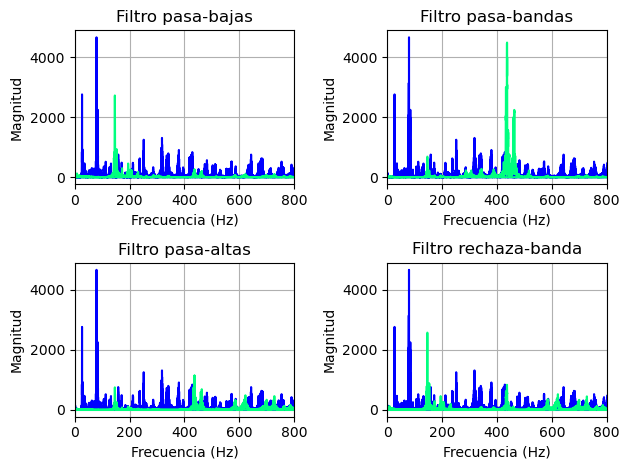

In [35]:
# Diseño del filtro Elíptico

#filtro pasa-bajas
b, a = sp.ellip(order, ripple_pass, ripple_stop, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y1 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum1 = fft.fft(y1)
# Obtener los valores absolutos del espectro
spectrum_abs1 = np.abs(spectrum1)
# Calcular las frecuencias correspondientes
freq1 = np.fft.fftfreq(len(y1), 1 / sampling_freq)


#filtro pasa-altas
b, a = sp.ellip(order, ripple_pass, ripple_stop, cutoff_freq2/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y2 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum2 = fft.fft(y2)
# Obtener los valores absolutos del espectro
spectrum_abs2 = np.abs(spectrum2)
# Calcular las frecuencias correspondientes
freq2 = np.fft.fftfreq(len(y2), 1 / sampling_freq)


#filtro pasa-bandas
b, a = sp.ellip(order, ripple_pass, ripple_stop, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a);
# Filtro aplicado a la señal de audio
y3 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum3 = fft.fft(y3)
# Obtener los valores absolutos del espectro
spectrum_abs3 = np.abs(spectrum3)
# Calcular las frecuencias correspondientes
freq3 = np.fft.fftfreq(len(y3), 1 / sampling_freq)


#filtro rechaza-bandas
b, a = sp.ellip(order, ripple_pass, ripple_stop, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a);
# Filtro aplicado a la señal de audio
y4 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum4 = fft.fft(y4)
# Obtener los valores absolutos del espectro
spectrum_abs4 = np.abs(spectrum4)
# Calcular las frecuencias correspondientes
freq4 = np.fft.fftfreq(len(y4), 1 / sampling_freq)


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(freq,spectrum_abs, color='blue')
axs[0, 0].plot(freq1, spectrum_abs1, color='springgreen')
axs[0, 0].set_xlim(0, 800)
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot(freq,spectrum_abs, color='blue')
axs[1, 0].plot(freq2, spectrum_abs2, color='springgreen')
axs[1, 0].set_xlim(0, 800)
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(freq,spectrum_abs, color='blue')
axs[0, 1].plot(freq3, spectrum_abs3, color='springgreen')
axs[0, 1].set_xlim(0, 800)
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot(freq,spectrum_abs, color='blue')
axs[1, 1].plot(freq4, spectrum_abs4, color='springgreen')
axs[1, 1].set_xlim(0, 800)
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

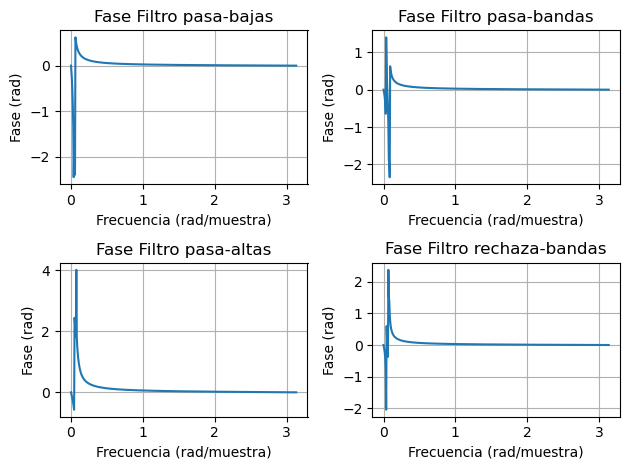

In [36]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

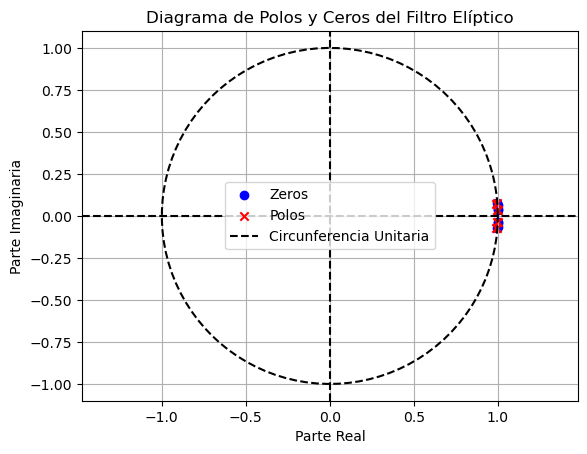

In [37]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Elíptico')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

In [38]:
print('Pasa-bajas')
display(Audio(y1, rate=fs))

print('Pasa-altas')
display(Audio(y2, rate=fs))

print('Pasa-bandas')
display(Audio(y3, rate=fs))

print('Rechaza-bandas')
display(Audio(y4, rate=fs))

Pasa-bajas


Pasa-altas


Pasa-bandas


Rechaza-bandas


##### E pasa-bajas no tiene una buena respuesta podemos escuchar frecuencias de la banda eliminada.
##### El pasa-altas no tiene una buena respuesta podemos escuchar frecuencias de la banda eliminada.
##### El pasa-bandas no tiene una buena respuesta podemos escuchar frecuencias de la banda eliminada.
##### El rechaza-bandas tiene una buena respuesta podemos escuchar frecuencias de las bandas pasantes.

## 2.4 Filtros Bessel

In [39]:
# Especificaciones del filtro
order = 4  # Orden del filtro
cutoff_freq = 262  # Frecuencia de corte en Hz
cutoff_freq2 = 526  # Frecuencia de corte en Hz
sampling_freq = fs  # Frecuencia de muestreo en Hz

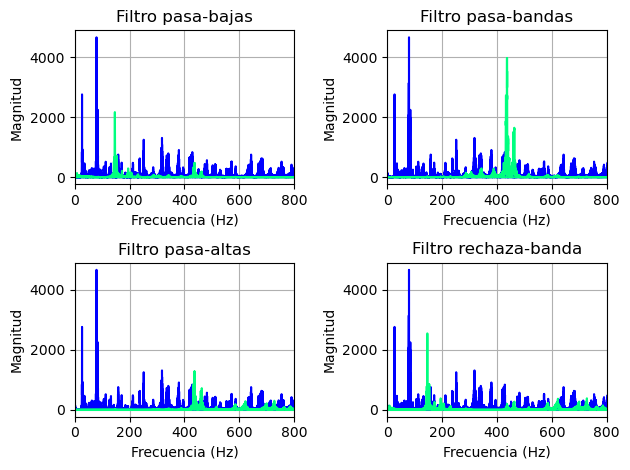

In [40]:
# Diseño del filtro Bessel


#filtro pasa-bajas
b, a = sp.bessel(order, cutoff_freq/(sampling_freq/2), btype='low', analog=False, output='ba')
# Respuesta en frecuencia del filtro
w1, h1 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y1 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum1 = fft.fft(y1)
# Obtener los valores absolutos del espectro
spectrum_abs1 = np.abs(spectrum1)
# Calcular las frecuencias correspondientes
freq1 = np.fft.fftfreq(len(y1), 1 / sampling_freq)

#filtro pasa-altas
b, a = sp.bessel(order, cutoff_freq2/(sampling_freq/2), btype='high', analog=False, output='ba')
w2, h2 = sp.freqz(b, a)
# Filtro aplicado a la señal de audio
y2 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum2 = fft.fft(y2)
# Obtener los valores absolutos del espectro
spectrum_abs2 = np.abs(spectrum2)
# Calcular las frecuencias correspondientes
freq2 = np.fft.fftfreq(len(y2), 1 / sampling_freq)


#filtro pasa-bandas
sampling_freq = fs  # Frecuencia de muestreo en Hz
b, a = sp.bessel(order, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandpass', analog=False, output='ba')
w3, h3 = sp.freqz(b, a);
# Filtro aplicado a la señal de audio
y3 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum3 = fft.fft(y3)
# Obtener los valores absolutos del espectro
spectrum_abs3 = np.abs(spectrum3)
# Calcular las frecuencias correspondientes
freq3 = np.fft.fftfreq(len(y3), 1 / sampling_freq)


#filtro rechaza-bandas
b, a = sp.bessel(order, [cutoff_freq/(sampling_freq/2) , cutoff_freq2/(sampling_freq/2)], btype='bandstop', analog=False, output='ba')
w4, h4 = sp.freqz(b, a);
# Filtro aplicado a la señal de audio
y4 = sp.lfilter(b, a, x)
# Aplicar la Transformada de Fourier a la señal
spectrum4 = fft.fft(y4)
# Obtener los valores absolutos del espectro
spectrum_abs4 = np.abs(spectrum4)
# Calcular las frecuencias correspondientes
freq4 = np.fft.fftfreq(len(y4), 1 / sampling_freq)


fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(freq,spectrum_abs, color='blue')
axs[0, 0].plot(freq1, spectrum_abs1, color='springgreen')
axs[0, 0].set_xlim(0, 800)
axs[0, 0].set_title("Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (Hz)')
axs[0, 0].set_ylabel('Magnitud')
axs[0, 0].grid(True)
axs[1, 0].plot(freq,spectrum_abs, color='blue')
axs[1, 0].plot(freq2, spectrum_abs2, color='springgreen')
axs[1, 0].set_xlim(0, 800)
axs[1, 0].set_title("Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (Hz)')
axs[1, 0].set_ylabel('Magnitud')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(freq,spectrum_abs, color='blue')
axs[0, 1].plot(freq3, spectrum_abs3, color='springgreen')
axs[0, 1].set_xlim(0, 800)
axs[0, 1].set_title("Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (Hz)')
axs[0, 1].set_ylabel('Magnitud')
axs[0, 1].grid(True)
axs[1, 1].plot(freq,spectrum_abs, color='blue')
axs[1, 1].plot(freq4, spectrum_abs4, color='springgreen')
axs[1, 1].set_xlim(0, 800)
axs[1, 1].set_title("Filtro rechaza-banda")
axs[1, 1].set_xlabel('Frecuencia (Hz)')
axs[1, 1].set_ylabel('Magnitud')
axs[1, 1].grid(True)
fig.tight_layout()

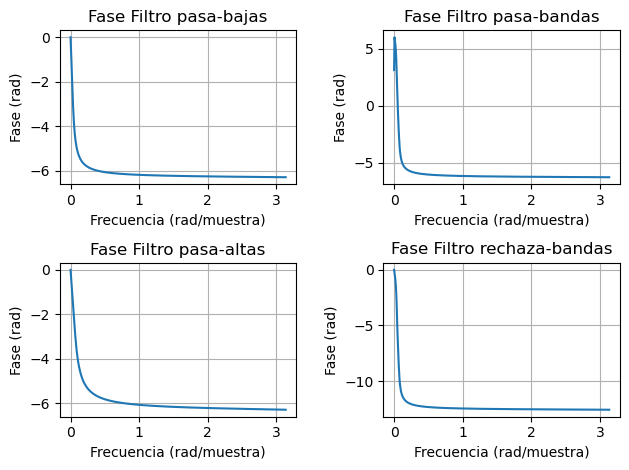

In [41]:
# Calcular la fase
phase1 = np.unwrap(np.angle(h1))
phase2 = np.unwrap(np.angle(h2))
phase3 = np.unwrap(np.angle(h3))
phase4 = np.unwrap(np.angle(h4))

fig, axs = plt.subplots(2, 2)
axs[0, 0].plot(w1, phase1)
axs[0, 0].set_title("Fase Filtro pasa-bajas")
axs[0, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 0].set_ylabel('Fase (rad)')
axs[0, 0].grid(True)
axs[1, 0].plot(w2, phase2)
axs[1, 0].set_title("Fase Filtro pasa-altas")
axs[1, 0].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 0].set_ylabel('Fase (rad)')
axs[1, 0].grid(True)
axs[1, 0].sharex(axs[0, 0])
axs[0, 1].plot(w3, phase3)
axs[0, 1].set_title("Fase Filtro pasa-bandas")
axs[0, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[0, 1].set_ylabel('Fase (rad)')
axs[0, 1].grid(True)
axs[1, 1].plot(w4, phase4)
axs[1, 1].set_title("Fase Filtro rechaza-bandas")
axs[1, 1].set_xlabel('Frecuencia (rad/muestra)')
axs[1, 1].set_ylabel('Fase (rad)')
axs[1, 1].grid(True)
fig.tight_layout()

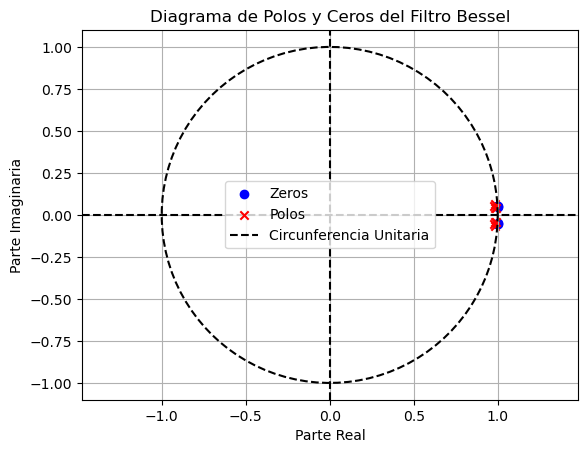

In [42]:
# Obtener los polos y ceros del filtro
zeros, poles, _ = sp.tf2zpk(b, a)

# Graficar el diagrama de polos y ceros
plt.figure()
plt.scatter(np.real(zeros), np.imag(zeros), marker='o', color='b', label='Zeros')
plt.scatter(np.real(poles), np.imag(poles), marker='x', color='r', label='Polos')
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), np.sin(np.linspace(0, 2*np.pi, 100)), 'k--', label='Circunferencia Unitaria')
plt.axvline(0, color='k', linestyle='--')
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Parte Real')
plt.ylabel('Parte Imaginaria')
plt.title('Diagrama de Polos y Ceros del Filtro Bessel')
plt.legend()
plt.grid(True)
plt.axis('equal')
plt.show()

In [43]:
print('Pasa-bajas')
display(Audio(y1, rate=fs))

print('Pasa-altas')
display(Audio(y2, rate=fs))

print('Pasa-bandas')
display(Audio(y3, rate=fs))

print('Rechaza-bandas')
display(Audio(y4, rate=fs))


Pasa-bajas


Pasa-altas


Pasa-bandas


Rechaza-bandas


##### E pasa-bajas tiene una buena respuesta podemos escuchar solo frecuencias de la banda pasante.
##### El pasa-altas no tiene una buena respuesta podemos escuchar frecuencias de la banda de transición.
##### El pasa-bandas  tiene una buena respuesta aunque podemos escuchar tenue las frecuencias de las bandas pasantes.
##### El rechaza-bandas tiene una buena respuesta podemos escuchar las frecuencias de las bandas pasantes.

# Conclusiones Generales

##### La elección del tipo de filtro para una aplicación musical específica depende de varios factores, como los requerimientos de diseño, las características deseadas de la respuesta en frecuencia y la naturaleza del sonido que se desea filtrar. Sin embargo, en términos generales, se pueden considerar las siguientes recomendaciones:

##### Pasa-bajas: Los filtros Butterworth y Chebyshev tipo I. Ambos filtros pueden proporcionar una atenuación suave en las frecuencias superiores, pero el filtro Butterworth tiene una respuesta en frecuencia más plana en la banda de paso.

##### Pasa-altas: Los filtros Butterworth y Chebyshev tipo II. Estos filtros permiten el paso de frecuencias altas y atenúan las frecuencias bajas. El filtro Butterworth presenta una respuesta en frecuencia más plana en la banda de paso, mientras que el filtro Chebyshev tipo II permite un mayor control sobre la atenuación en la banda de rechazo.

##### Pasa-banda: Los filtros Chebyshev tipo I y tipo II. Estos filtros permiten el paso de un rango de frecuencias específico y atenúan las frecuencias fuera de ese rango. El filtro Chebyshev tipo I ofrece una respuesta en frecuencia más plana en la banda de paso, mientras que el filtro Chebyshev tipo II brinda un mayor control sobre la atenuación en las bandas de paso y rechazo.

##### Rechaza-banda: Los filtros Elípticos. Estos filtros atenúan selectivamente un rango de frecuencias específico y permiten el paso de las frecuencias fuera de ese rango. Los filtros Elípticos ofrecen una alta selectividad y pueden lograr una mayor atenuación en la banda de rechazo en comparación con otros tipos de filtros.

##### Es importante tener en cuenta que la elección del filtro dependerá de los requisitos específicos de la aplicación musical, como el ancho de banda, la selectividad, la atenuación en las bandas de paso y rechazo, y otras consideraciones. Además, cada tipo de filtro tiene sus propias ventajas y desventajas en términos de diseño y rendimiento. Es recomendable realizar pruebas y evaluaciones para determinar cuál de estos filtros se adapta mejor a una aplicación musical particular.
